In [1]:
import matplotlib.pyplot as plt
import matplotlib  #ajustar
import numpy as np
from minisom import MiniSom
import idx2numpy
import pickle
import csv

import import_ipynb
from utils import *
from autoencoder_and_clustering_models import *
from som_plots import *

importing Jupyter notebook from utils.ipynb
importing Jupyter notebook from autoencoder_and_clustering_models.ipynb
importing Jupyter notebook from som_plots.ipynb


# Function to read MNIST Dataset

<br/>
Download [MNIST](http://yann.lecun.com/exdb/mnist/), save it in 'arq_path' and unzip it. <br/>
This function also normalizes the images between 0 and 1.<br/>

In [2]:
def read_preprocess_dataset( arq_path, indexes_train, indexes_val = np.empty(0)):

    file = arq_path + '\\train-images-idx3-ubyte\\train-images.idx3-ubyte'
    img_train_val = idx2numpy.convert_from_file(file)

    file = arq_path + '\\t10k-images-idx3-ubyte\\t10k-images.idx3-ubyte'
    img_test = idx2numpy.convert_from_file(file)

    file = arq_path + '\\train-labels-idx1-ubyte\\train-labels.idx1-ubyte'
    target_train_val = idx2numpy.convert_from_file(file)

    file = arq_path + '\\t10k-labels-idx1-ubyte\\t10k-labels.idx1-ubyte'
    target_test = idx2numpy.convert_from_file(file)
    
    
    indexes_train = indexes_train.astype(int)
    indexes_val = indexes_val.astype(int)
    
    data_train_val = np.expand_dims(img_train_val, axis=3)
    data_test = np.expand_dims(img_test, axis=3)

    data_train_val = data_train_val/255
    data_test = data_test/255
    
    
    if indexes_val.size==0:
        data_train = data_train_val
        target_train = target_train_val
        
        return data_train, data_test, target_train, target_test
    
    else:
        data_train = data_train_val[indexes_train]
        target_train = target_train_val[indexes_train]
        
        data_val = data_train_val[indexes_val]
        target_val = target_train_val[indexes_val]
        
        return data_train, data_val, data_test, target_train, target_val, target_test

# Summary of the structure of the encoder that will be used

In [3]:
print('Example of one of the pre trained auto convolutional encoder \n')
model, model_encoder = deep_clustering_model('D:\Luiza\OneDrive\Documentos\Doutorado\MeusProjetos\SOM\mnist\Encoder_model_0.h5', input_shape = (28,28,1))
model_encoder.summary()

Example of one of the pre trained auto convolutional encoder 

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_0 (Conv2D)              (None, 28, 28, 32)        1600      
_________________________________________________________________
AC_0 (Activation)            (None, 28, 28, 32)        0         
_________________________________________________________________
BN_0 (BatchNormalization)    (None, 28, 28, 32)        128       
_________________________________________________________________
max_pool_0 (MaxPooling2D)    (None, 14, 14, 32)        0         
_________________________________________________________________
conv_1 (Conv2D)              (None, 14, 14, 16)        12816     
_________________________________________________________________
AC_1 (Activation)            (None, 14, 14, 16)        0         
___________________________________________________________

<br/><br/>
# Custom Decay Function

Custom function to calculate the decay of the learning rate and the neighborhood throughout the training.
<br/><br/>


In [4]:
def test_decay(learning_rate, t, max_iter):
    """Decay function of the learning process.
    Parameters
    ----------
    learning_rate : float
        current learning rate.
    t : int
        current iteration.
    max_iter : int
        maximum number of iterations for the training.
    """
  
    #return learning_rate*np.exp(-t/7500) + 10**-17
    return learning_rate / (1+t/(max_iter/23))

<br/><br/>
# Training SOM with Flattened MNIST Images

<br/><br/>
For a first test, the MNIST images were flattened and used as inputs to train a self organizing map. <br/>
For a fair comparison with the other trained models, the test dataset is used after training to evaluate the trained map.<br/>

In [5]:
arq_path = 'D:\Luiza\OneDrive\Documentos\Doutorado\MeusProjetos\SOM\mnist'

with open(arq_path+"\crossValidation_indexes.csv", newline='') as f:
    list_indexes = csv.reader(f)
    list_indexes = list(list(rec) for rec in csv.reader(f, delimiter=','))
list_indexes = (np.array(list_indexes)).astype(int)

i_crossVal = []
i_train = np.arange(5)
indexes_val = list_indexes[i_crossVal]
indexes_train = np.empty(0)
for i in range(len(i_train)):
    indexes_train = np.concatenate ((indexes_train, list_indexes[i_train[i]]), axis=0 )
indexes_val = np.array(indexes_val)
indexes_train = np.array(indexes_train)
        
data_train, data_test, label_train, label_test = read_preprocess_dataset(arq_path, indexes_train, indexes_val ) 

        
y_hat_train = data_train.reshape( (len(data_train),-1) ) 
y_hat_test = data_test.reshape( (len(data_test),-1) ) 
       
som = MiniSom(25,25, y_hat_train.shape[1], sigma=6, learning_rate=.1, activation_distance='euclidean', topology='hexagonal',neighborhood_function='gaussian',decay_function=test_decay, random_seed=None)
print("Training model ",  '...')
som.train(y_hat_train, 700000)  # random training
print('\n')
    
# saving the som in the file som.p
with open(arq_path + '\SOM_model_trained_with_flattened_mnist.p', 'wb') as outfile:
    pickle.dump(som, outfile)

Training model  ...






------------------------------------------------------------------------------------------------------
					 Results of Model 
------------------------------------------------------------------------------------------------------




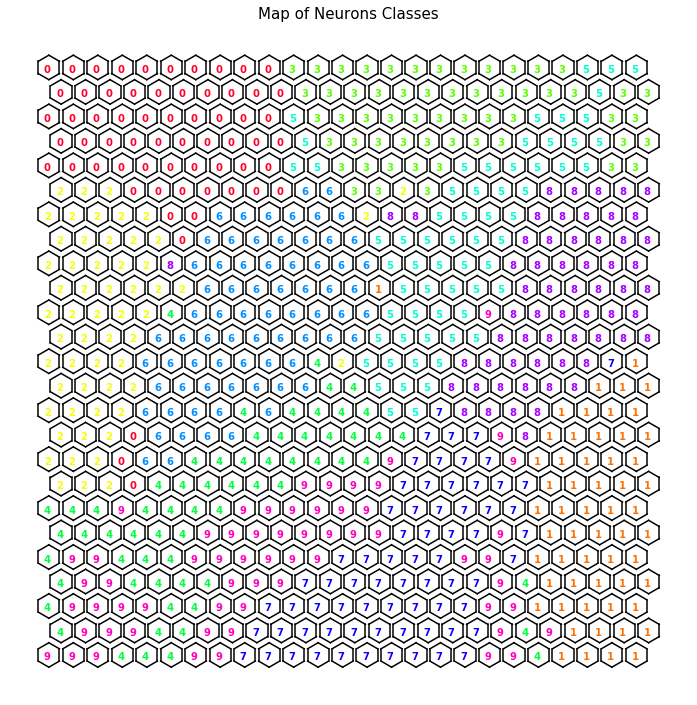

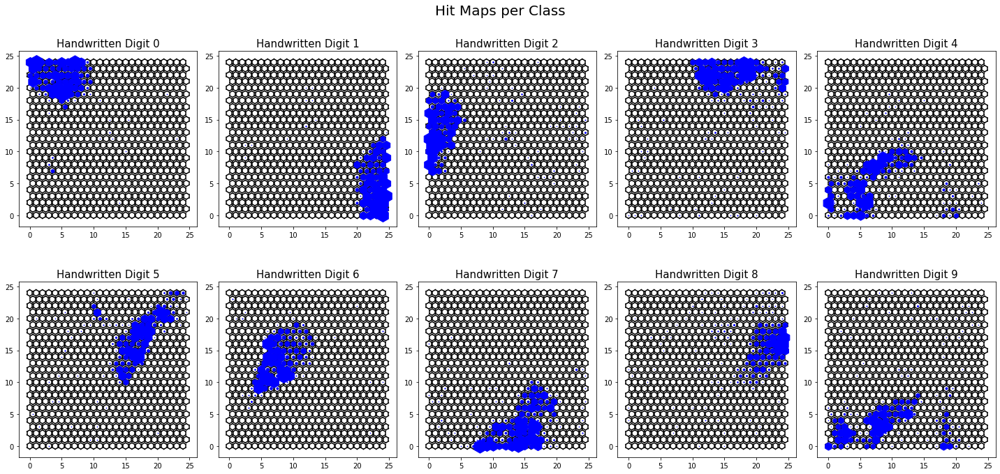



	Map of Neurons Distance


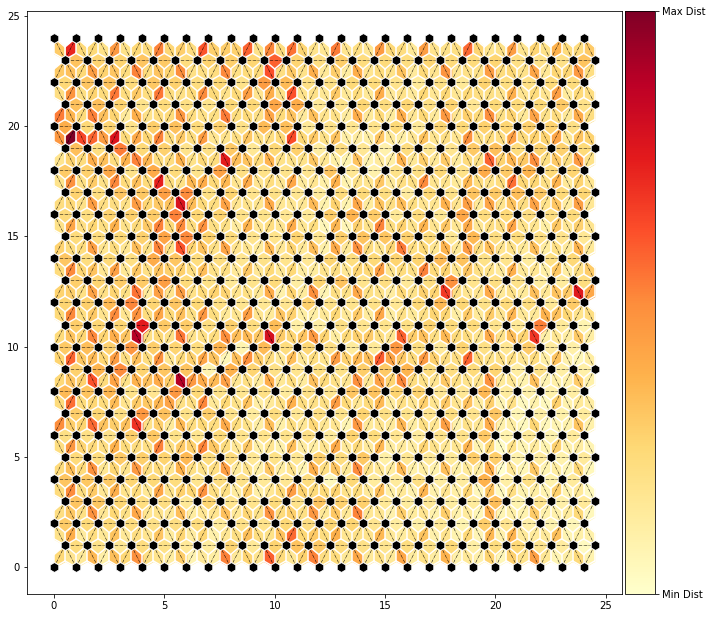

Clusterization purity = 0.92120
Clusterization entropy = 0.32130




In [18]:
arq_path = 'D:\Luiza\OneDrive\Documentos\Doutorado\MeusProjetos\SOM\mnist'
with open(arq_path+"\crossValidation_indexes.csv", newline='') as f:
    list_indexes = csv.reader(f)
    list_indexes = list(list(rec) for rec in csv.reader(f, delimiter=','))
list_indexes = (np.array(list_indexes)).astype(int)
i_crossVal = []
i_train = np.arange(5)
indexes_val = list_indexes[i_crossVal]
indexes_train = np.empty(0)
for i in range(len(i_train)):
    indexes_train = np.concatenate ((indexes_train, list_indexes[i_train[i]]), axis=0 )
indexes_val = np.array(indexes_val)
indexes_train = np.array(indexes_train)
data_train, data_test, label_train, label_test = read_preprocess_dataset(arq_path, indexes_train, indexes_val )
labels = label_test

with open(arq_path + '\SOM_model_trained_with_flattened_mnist.p', 'rb') as infile:
    som = pickle.load(infile)
    
y_hat_test = data_test.reshape( (len(data_test),-1) )   
data = y_hat_test
    
print('\n')
print('------------------------------------------------------------------------------------------------------')
print('\t\t\t\t\t Results of Model ')
print('------------------------------------------------------------------------------------------------------')
print('\n')
fig = plt.figure(figsize=(10,10))
pur, entro = neurons_classes(som, data, labels)
plt.title('Map of Neurons Classes', fontsize=15)
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.savefig( arq_path + '\\neurons_classes_flattenedImage.jpg', bbox_inches='tight')
plt.show()

print('\n')
fig = plt.figure(figsize=(20,10))
for i in range(10):
    ax = fig.add_subplot(2,5,i+1)
    som_hits(data[labels==i,:],som,annotation=False)
    ax.set_title('Handwritten Digit '+str(i),  fontsize=15)
fig.suptitle('Hit Maps per Class', fontsize=20)
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.savefig(arq_path + '\\hit_map_per_class_flattenedImage.jpg', bbox_inches='tight')
plt.show()
 
print('\n')
print('\tMap of Neurons Distance')
fig = plt.figure(figsize=(10,10))
dist_map(som, distSquared = False)
#plt.title('Map of Neurons Distance', fontsize=15)
fig.tight_layout()
fig.subplots_adjust(top=0.9)
plt.savefig(arq_path + '\\neurons_distances_flattenedImage.jpg', bbox_inches='tight')
plt.show()
   

print('Clusterization purity = %.5f' %(pur))
print('Clusterization entropy = %.5f' %(entro))
  
print('\n')


<br/><br/>
# Training SOM with Encoded MNIST Images

<br/><br/>
As a second test, the MNIST images will be first encoded using the already trained encoders and, after that, used as inputs to train SOM.<br/>
As the autoencoders were trained using 5-folds cross-validation, the five resulted encoders will be used here. <br/>
One SOM will be trained with the images encoded by each of the encoders. <br/>
Each one of the five SOMs trained will be tested with the same test dataset.<br/>



In [5]:


arq_path = 'D:\Luiza\OneDrive\Documentos\Doutorado\MeusProjetos\SOM\mnist'

with open(arq_path+"\crossValidation_indexes.csv", newline='') as f:
    list_indexes = csv.reader(f)
    list_indexes = list(list(rec) for rec in csv.reader(f, delimiter=','))
list_indexes = (np.array(list_indexes)).astype(int)
   
    
for i_crossVal in range(5):
    
        
    i_train = np.array([w for w in range(5) if not w == i_crossVal])
        
    indexes_val = list_indexes[i_crossVal]
    indexes_train = np.empty(0)
    for i in range(len(i_train)):
        indexes_train = np.concatenate ((indexes_train, list_indexes[i_train[i]]), axis=0 )
    indexes_val = np.array(indexes_val)
    indexes_train = np.array(indexes_train)
        
    data_train, data_val, data_test, label_train, label_val, label_test = read_preprocess_dataset( arq_path, indexes_train, indexes_val ) 

    model, model_encoder = deep_clustering_model(arq_path + '\Encoder_model_'+str(i_crossVal)+'.h5', input_shape = (28,28,1))
        
    y_hat_train = model_encoder.predict( data_train )
    y_hat_test = model_encoder.predict( data_test )
        
    som = MiniSom(25,25, 10, sigma=6, learning_rate=.1, activation_distance='euclidean', topology='hexagonal',neighborhood_function='gaussian',decay_function=test_decay, random_seed=None)
    print("Training model ", i_crossVal, '...')
    som.train(y_hat_train, 700000)  # random training
    print('\n')
    
    # saving the som in the file som.p
    with open(arq_path + '\SOM_model_'+str(i_crossVal)+'.p', 'wb') as outfile:
        pickle.dump(som, outfile)

    
    

Training model  0 ...


Training model  1 ...


Training model  2 ...


Training model  3 ...


Training model  4 ...






------------------------------------------------------------------------------------------------------
					 Results of Model  0
------------------------------------------------------------------------------------------------------




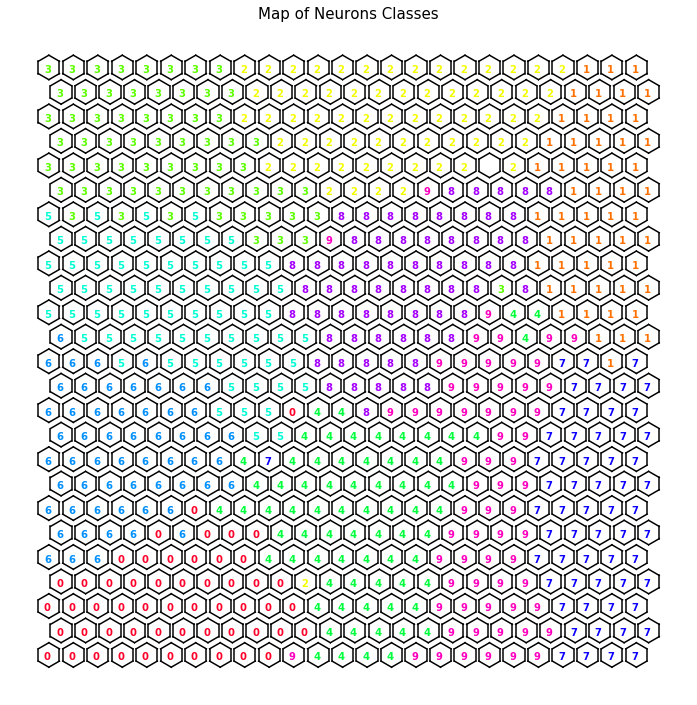

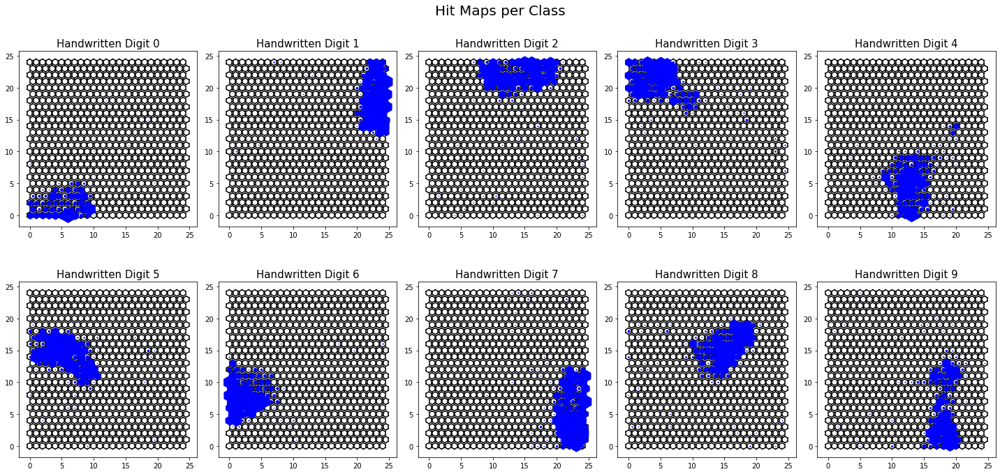



	Map of Neurons Distance


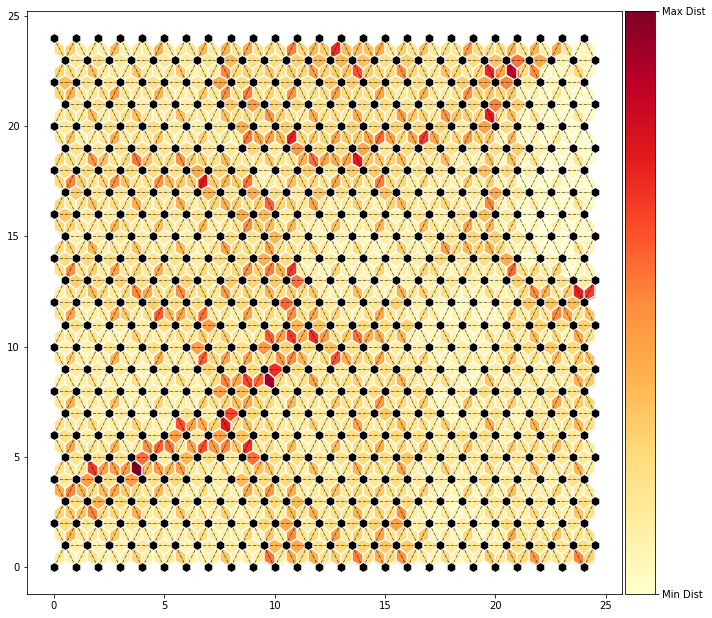

Clusterization purity = 0.95900
Clusterization entropy = 0.16179




------------------------------------------------------------------------------------------------------
					 Results of Model  1
------------------------------------------------------------------------------------------------------




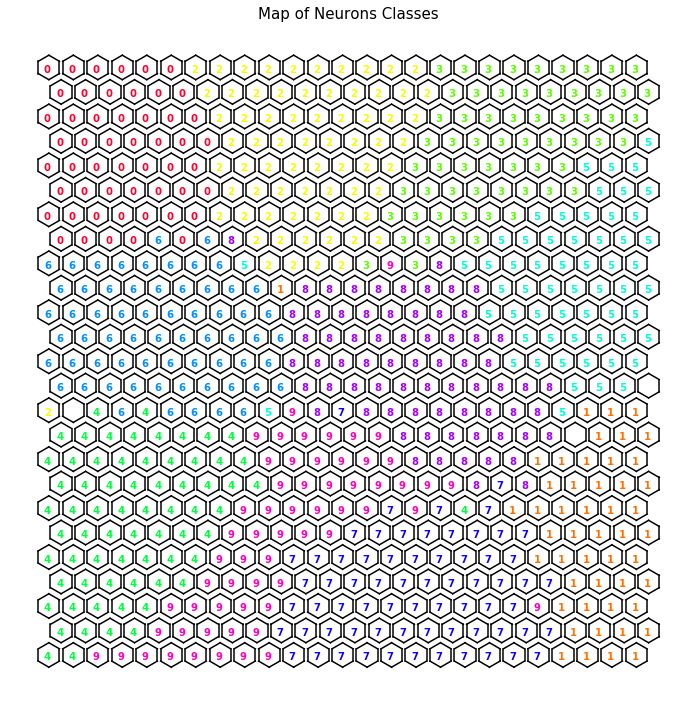

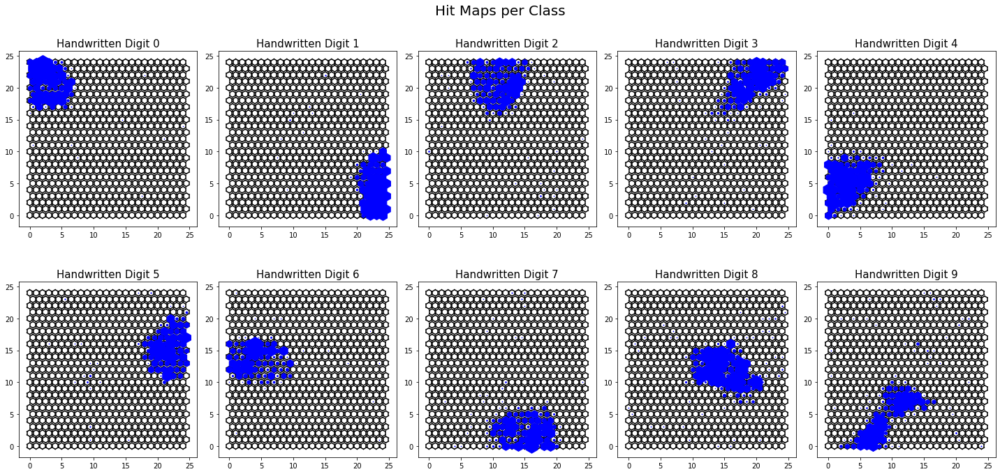



	Map of Neurons Distance


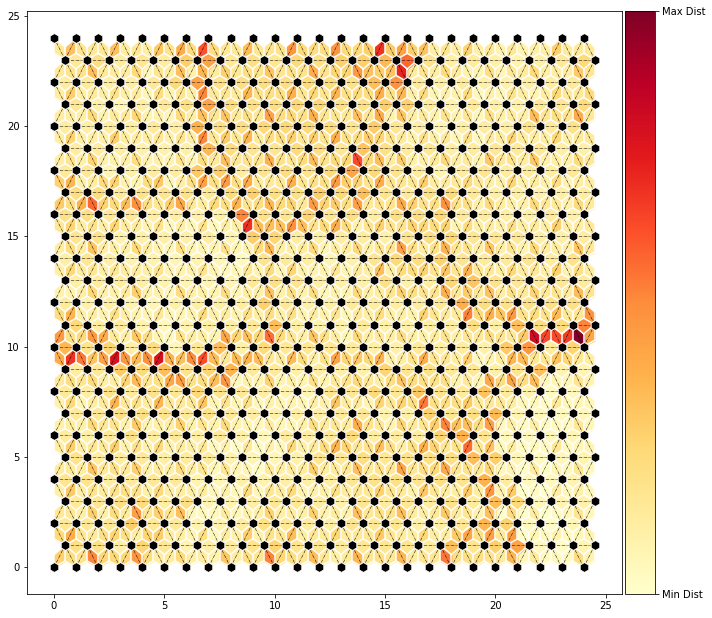

Clusterization purity = 0.96090
Clusterization entropy = 0.16340




------------------------------------------------------------------------------------------------------
					 Results of Model  2
------------------------------------------------------------------------------------------------------




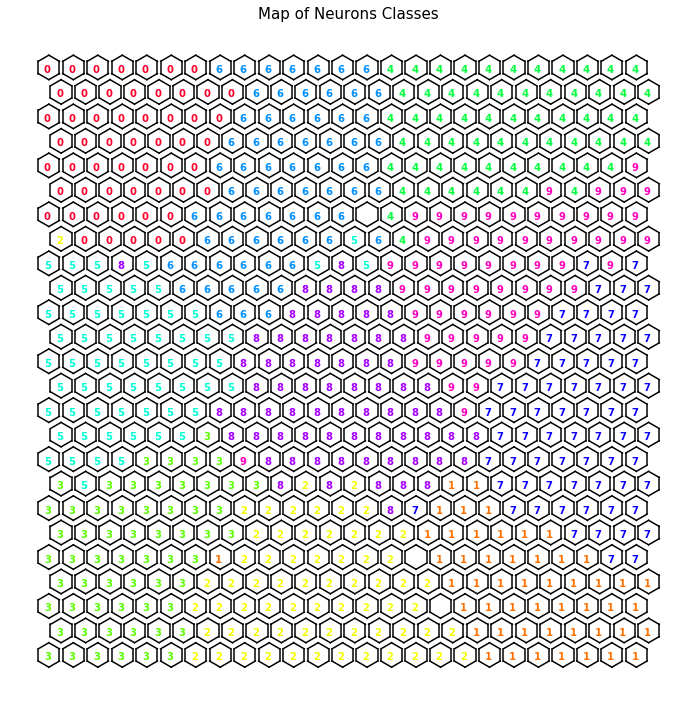

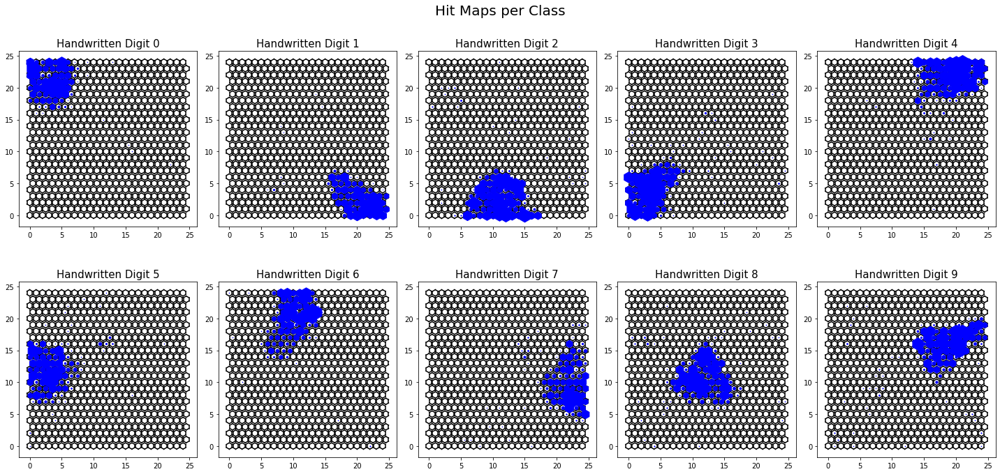



	Map of Neurons Distance


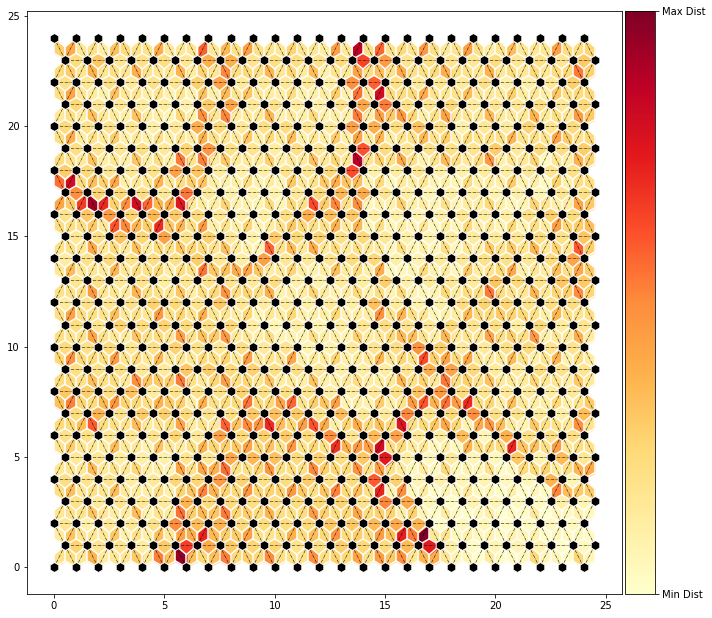

Clusterization purity = 0.96020
Clusterization entropy = 0.16176




------------------------------------------------------------------------------------------------------
					 Results of Model  3
------------------------------------------------------------------------------------------------------




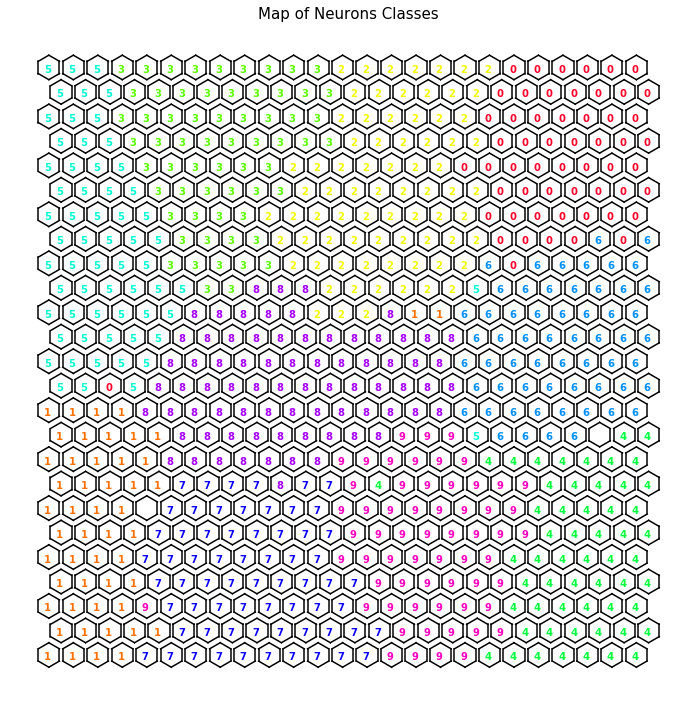

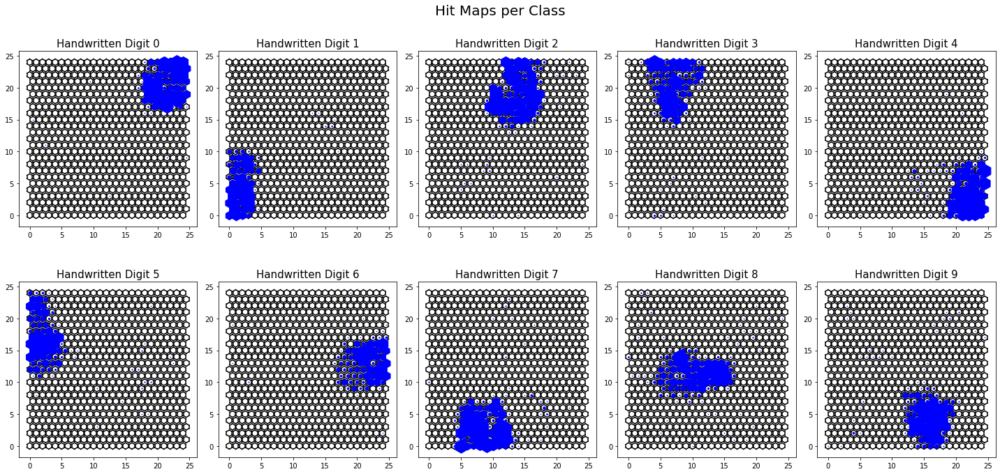



	Map of Neurons Distance


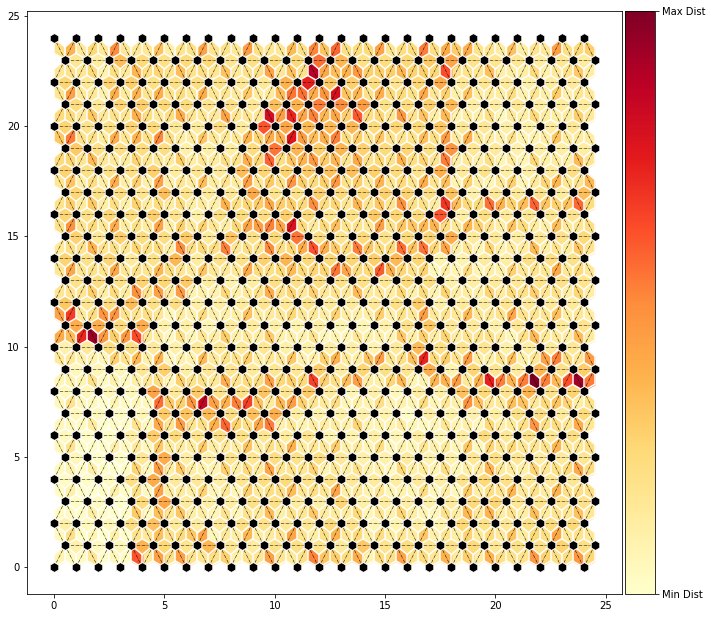

Clusterization purity = 0.96070
Clusterization entropy = 0.16346




------------------------------------------------------------------------------------------------------
					 Results of Model  4
------------------------------------------------------------------------------------------------------




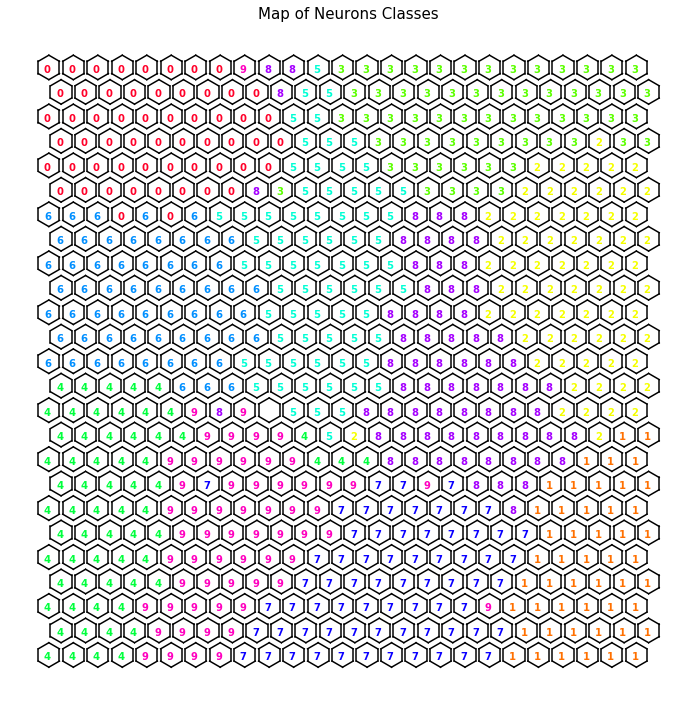

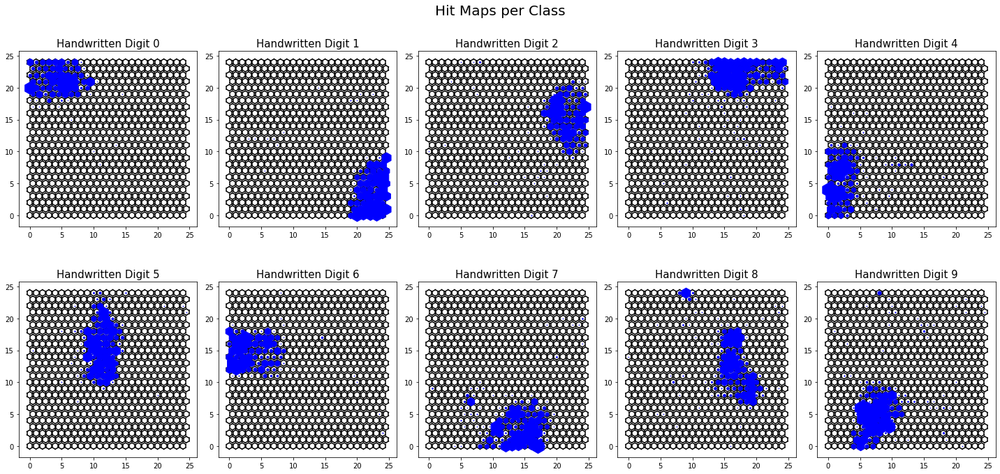



	Map of Neurons Distance


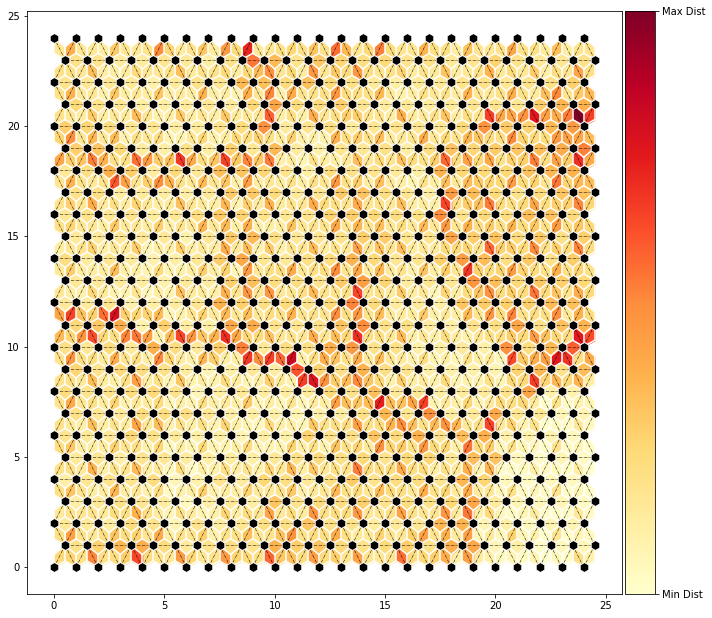

Clusterization purity = 0.95790
Clusterization entropy = 0.17436




In [6]:
labels = label_test
pur = np.zeros((5))
entro = np.zeros((5))

for i_crossVal in range(5):
    
    model, model_encoder = deep_clustering_model(arq_path + '\Encoder_model_'+str(i_crossVal)+'.h5', input_shape = (28,28,1))
    
    with open(arq_path + '\SOM_model_'+str(i_crossVal)+'.p', 'rb') as infile:
        som = pickle.load(infile)
    
    
    data = model_encoder.predict( data_test )
    
    print('\n')
    print('------------------------------------------------------------------------------------------------------')
    print('\t\t\t\t\t Results of Model ', str(i_crossVal))
    print('------------------------------------------------------------------------------------------------------')
    print('\n')
    fig = plt.figure(figsize=(10,10))
    pur[i_crossVal], entro[i_crossVal] = neurons_classes(som, data, labels)
    plt.title('Map of Neurons Classes', fontsize=15)
    fig.tight_layout()
    fig.subplots_adjust(top=0.95)
    plt.savefig(arq_path + '\\neurons_classes_encodedImage_'+str(i_crossVal)+'.jpg', bbox_inches='tight')
    plt.show()
    
    print('\n')
    fig = plt.figure(figsize=(20,10))
    for i in range(10):
        ax = fig.add_subplot(2,5,i+1)
        som_hits(data[labels==i,:],som,annotation=False)
        ax.set_title('Handwritten Digit '+str(i),  fontsize=15)
    fig.suptitle('Hit Maps per Class', fontsize=20)
    fig.tight_layout()
    fig.subplots_adjust(top=0.95)
    plt.savefig(arq_path + '\\hit_map_per_class_encodedImage_'+str(i_crossVal)+'.jpg', bbox_inches='tight')
    plt.show()
    
    print('\n')
    print('\tMap of Neurons Distance')
    fig = plt.figure(figsize=(10,10))
    dist_map(som, distSquared = False)
    #plt.title('Map of Neurons Distance', fontsize=15)
    fig.tight_layout()
    fig.subplots_adjust(top=0.9)
    plt.savefig(arq_path + '\\neurons_distances_encodedImage_'+str(i_crossVal)+'.jpg', bbox_inches='tight')
    plt.show()
    
    
    print('Clusterization purity = %.5f' %(pur[i_crossVal]))
    print('Clusterization entropy = %.5f' %(entro[i_crossVal]))
    
    print('\n')


In [7]:
pur_mean = np.mean(pur)
pur_std = np.std(pur)

entro_mean = np.mean(entro)
entro_std = np.std(entro)
    
print ('\nThe mean purity, based on previous known classes, for the test dataset using cross-validation is equal to %.5f, with standard deviation equal to %.5f' %(pur_mean, pur_std))
print ('\nThe mean entropy, based on previous known classes, for the test dataset using cross-validation is equal to %.5f, with standard deviation equal to %.5f' %(entro_mean, entro_std))


The mean purity, based on previous known classes, for the test dataset using cross-validation is equal to 0.95974, with standard deviation equal to 0.00113

The mean entropy, based on previous known classes, for the test dataset using cross-validation is equal to 0.16495, with standard deviation equal to 0.00476
